#                                                  Telecom Churn Case Study


*  By Satprem Rath & Sowmya Sangeethan








## Loading the Data Set

In [0]:
# Importing the required libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler

%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

In [2]:
#importing the dataset


from google.colab import drive 
drive.mount('/content/gdrive')


telecom = pd.read_csv('gdrive/My Drive/telecom_churn_data.csv')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [3]:
# Reading the top 5 lines of the data set
telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,...,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,...,150.76,109.61,0.00,212.17,212.17,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53.76,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.00,0.00,0.00,...,0.00,0.00,0.00,NaN,0.00,0.00,NaN,NaN,28.61,7.60,NaN,NaN,0.0,0.0,NaN,0,1,0,0,0,0,2,0,0,0,0,0,0,0,0,0,NaN,1.0,1.0,NaN,1006,0.0,0.0,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,189.058,210.226,290.714,11.54,55.24,37.26,74.81,143.33,220.59,208.36,118.91,0.0,0.00,0.00,38.49,0.0,0.00,0.00,70.94,7.19,28.74,13.58,14.39,29.34,16.86,38.46,28.16,24.11,21.79,15.61,...,0.00,0.00,8.42,NaN,NaN,NaN,2.84,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,251.102,508.054,389.500,99.91,54.39,310.98,241.71,123.31,109.01,71.68,113.54,0.0,54.86,44.38,0.00,0.0,28.09,39.04,0.00,73.68,34.81,10.61,15.49,107.43,83.21,22.46,65.46,1.91,0.65,4.91,...,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,309.876,238.174,163.426,50.31,149.44,83.89,58.78,76.96,91.88,124.26,45.81,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,50.31,149.44,83.89,58.78,67.64,91.88,124.26,37.89,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.00


In [4]:
# Checking null values
round(100*(telecom.isnull().sum()/len(telecom.index)), 2)

mobile_number            0.00
circle_id                0.00
loc_og_t2o_mou           1.02
std_og_t2o_mou           1.02
loc_ic_t2o_mou           1.02
last_date_of_month_6     0.00
last_date_of_month_7     0.60
last_date_of_month_8     1.10
last_date_of_month_9     1.66
arpu_6                   0.00
arpu_7                   0.00
arpu_8                   0.00
arpu_9                   0.00
onnet_mou_6              3.94
onnet_mou_7              3.86
onnet_mou_8              5.38
onnet_mou_9              7.75
offnet_mou_6             3.94
offnet_mou_7             3.86
offnet_mou_8             5.38
offnet_mou_9             7.75
roam_ic_mou_6            3.94
roam_ic_mou_7            3.86
roam_ic_mou_8            5.38
roam_ic_mou_9            7.75
roam_og_mou_6            3.94
roam_og_mou_7            3.86
roam_og_mou_8            5.38
roam_og_mou_9            7.75
loc_og_t2t_mou_6         3.94
                        ...  
arpu_2g_9               74.08
night_pck_user_6        74.85
night_pck_

In [5]:
telecom.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


## Identifying High Value Customers

In [0]:
telecom['total_data_rech_6'] = telecom['av_rech_amt_data_6'] * telecom['total_rech_data_6']
telecom['total_data_rech_7'] = telecom['av_rech_amt_data_7'] * telecom['total_rech_data_7']

telecom['amt_data_6'] = telecom[['total_rech_amt_6','total_data_rech_6']].sum(axis=1)
telecom['amt_data_7'] = telecom[['total_rech_amt_7','total_data_rech_7']].sum(axis=1)

telecom['avg_data_amt_6_7'] = telecom[['amt_data_6','amt_data_7']].mean(axis=1)

In [7]:
#checking the dataframe

telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,...,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_6,total_data_rech_7,amt_data_6,amt_data_7,avg_data_amt_6_7
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,...,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58,252.0,252.0,614.0,504.0,559.0
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53.76,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.00,0.00,0.00,...,0.00,NaN,NaN,28.61,7.60,NaN,NaN,0.0,0.0,NaN,0,1,0,0,0,0,2,0,0,0,0,0,0,0,0,0,NaN,1.0,1.0,NaN,1006,0.0,0.0,0.00,0.00,NaN,154.0,74.0,538.0,306.0
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,189.058,210.226,290.714,11.54,55.24,37.26,74.81,143.33,220.59,208.36,118.91,0.0,0.00,0.00,38.49,0.0,0.00,0.00,70.94,7.19,28.74,13.58,14.39,29.34,16.86,38.46,28.16,24.11,21.79,15.61,...,NaN,2.84,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1.0,1103,0.0,0.0,4.17,0.00,NaN,NaN,168.0,315.0,241.5
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,251.102,508.054,389.500,99.91,54.39,310.98,241.71,123.31,109.01,71.68,113.54,0.0,54.86,44.38,0.00,0.0,28.09,39.04,0.00,73.68,34.81,10.61,15.49,107.43,83.21,22.46,65.46,1.91,0.65,4.91,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.00,NaN,NaN,230.0,310.0,270.0
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,309.876,238.174,163.426,50.31,149.44,83.89,58.78,76.96,91.88,124.26,45.81,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,50.31,149.44,83.89,58.78,67.64,91.88,124.26,37.89,0.00,0.00,0.00,...,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.00,56.0,NaN,252.0,350.0,301.0


In [8]:
# High Value Customers are those whose recharge amount is more than equal to 70th percentile

hvc = telecom[(telecom['avg_data_amt_6_7']>= telecom['avg_data_amt_6_7'].quantile(0.7))]
hvc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30001 entries, 0 to 99997
Columns: 231 entries, mobile_number to avg_data_amt_6_7
dtypes: float64(184), int64(35), object(12)
memory usage: 53.1+ MB


##### If we use greater than or equal to 70th percentile then we are getting 30K records, let's try with only greater than 70th percentile to get about 29.9K records

In [9]:
hvc = telecom[(telecom['avg_data_amt_6_7']> telecom['avg_data_amt_6_7'].quantile(0.7))]
hvc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29953 entries, 0 to 99997
Columns: 231 entries, mobile_number to avg_data_amt_6_7
dtypes: float64(184), int64(35), object(12)
memory usage: 53.0+ MB


##### After filtering the high value customers we got 29.9K rows as requested in the problem statement

## Identifying the Churned Customers

##### Identifying the churned customers based on the last month

In [10]:
hvc.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,...,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_6,total_data_rech_7,amt_data_6,amt_data_7,avg_data_amt_6_7
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,...,212.17,NaN,212.17,212.17,212.17,NaN,0.0,0.0,0.0,NaN,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,1.0,1.0,1.0,NaN,968,30.40,0.00,101.20,3.58,252.0,252.0,614.0,504.0,559.0
7,7000701601,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,NaN,453.43,567.16,325.91,NaN,16.23,33.49,31.64,NaN,23.74,12.59,38.06,NaN,51.39,31.38,40.28,NaN,308.63,447.38,162.28,NaN,62.13,55.14,53.23,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,802,57.74,19.38,18.74,0.00,NaN,NaN,1580.0,790.0,1185.0
8,7001524846,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,378.721,492.223,137.362,166.787,413.69,351.03,35.08,33.46,94.66,80.63,136.48,108.71,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,297.13,217.59,12.49,26.13,80.96,70.58,50.54,34.58,0.00,0.00,0.00,...,19.83,NaN,NaN,0.00,0.00,NaN,NaN,0.0,0.0,NaN,0,1,0,0,0,1,3,0,0,0,0,0,0,0,0,0,NaN,1.0,1.0,NaN,315,21.03,910.65,122.16,0.00,NaN,354.0,437.0,955.0,696.0
21,7002124215,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,514.453,597.753,637.760,578.596,102.41,132.11,85.14,161.63,757.93,896.68,983.39,869.89,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,4.48,6.16,23.34,29.98,91.81,87.93,104.81,107.54,0.75,0.00,1.58,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,720,0.00,0.00,0.00,0.00,NaN,NaN,600.0,680.0,640.0
23,7000887461,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,74.350,193.897,366.966,811.480,48.96,50.66,33.58,15.74,85.41,89.36,205.89,111.88,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,48.96,50.66,33.58,15.74,82.94,83.01,148.56,83.73,0.00,0.00,0.00,...,197.27,212.17,NaN,301.78,150.67,212.17,NaN,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,2,1,1,0,0,1,0,NaN,1.0,1.0,1.0,604,40.45,51.86,0.00,0.00,NaN,712.0,0.0,1166.0,583.0


In [11]:
hvc['total_ic_mou_9'].head()

0       0.00
7       0.00
8      34.91
21    252.61
23    127.48
Name: total_ic_mou_9, dtype: float64

In [12]:
hvc['total_og_mou_9'].head()

0        0.00
7        0.00
8      142.18
21    1031.53
23     127.63
Name: total_og_mou_9, dtype: float64

In [13]:
hvc['total_calls_mou_9'] = hvc['total_ic_mou_9'] + hvc['total_og_mou_9']
hvc['total_calls_mou_9'].head()

0        0.00
7        0.00
8      177.09
21    1284.14
23     255.11
Name: total_calls_mou_9, dtype: float64

In [14]:
hvc['vol_2g_mb_9'].head()

0      0.00
7      0.00
8      0.00
21     0.00
23    13.93
Name: vol_2g_mb_9, dtype: float64

In [15]:
hvc['vol_3g_mb_9'].head()

0       0.00
7       0.00
8       0.00
21      0.00
23    314.74
Name: vol_3g_mb_9, dtype: float64

In [16]:
hvc['total_internet_mb_9'] = hvc['vol_2g_mb_9'] + hvc['vol_3g_mb_9']
hvc['total_internet_mb_9'].head()

0       0.00
7       0.00
8       0.00
21      0.00
23    328.67
Name: total_internet_mb_9, dtype: float64

In [0]:
hvc['churn'] = np.where(((hvc['total_calls_mou_9'] == 0.00) & (hvc['total_internet_mb_9'] == 0)), 1, 0)

In [18]:
# count the churn values

hvc['churn'].value_counts()

0    27520
1     2433
Name: churn, dtype: int64

In [19]:
#calculating the percentage of churn

100*(hvc['churn'].value_counts()/hvc.shape[0])

0    91.877274
1     8.122726
Name: churn, dtype: float64

From the above, 8.1% of high value customers are churned

##  Deriving New Features 

In [0]:
hvc['arpu_diff'] = hvc.arpu_8 - ((hvc.arpu_6 + hvc.arpu_7)/2)

hvc['onnet_mou_diff'] = hvc.onnet_mou_8 - ((hvc.onnet_mou_6 + hvc.onnet_mou_7)/2)

hvc['offnet_mou_diff'] = hvc.offnet_mou_8 - ((hvc.offnet_mou_6 + hvc.offnet_mou_7)/2)

hvc['roam_ic_mou_diff'] = hvc.roam_ic_mou_8 - ((hvc.roam_ic_mou_6 + hvc.roam_ic_mou_7)/2)

hvc['roam_og_mou_diff'] = hvc.roam_og_mou_8 - ((hvc.roam_og_mou_6 + hvc.roam_og_mou_7)/2)

hvc['loc_og_mou_diff'] = hvc.loc_og_mou_8 - ((hvc.loc_og_mou_6 + hvc.loc_og_mou_7)/2)

hvc['std_og_mou_diff'] = hvc.std_og_mou_8 - ((hvc.std_og_mou_6 + hvc.std_og_mou_7)/2)

hvc['isd_og_mou_diff'] = hvc.isd_og_mou_8 - ((hvc.isd_og_mou_6 + hvc.isd_og_mou_7)/2)

hvc['spl_og_mou_diff'] = hvc.spl_og_mou_8 - ((hvc.spl_og_mou_6 + hvc.spl_og_mou_7)/2)

hvc['total_og_mou_diff'] = hvc.total_og_mou_8 - ((hvc.total_og_mou_6 + hvc.total_og_mou_7)/2)

hvc['loc_ic_mou_diff'] = hvc.loc_ic_mou_8 - ((hvc.loc_ic_mou_6 + hvc.loc_ic_mou_7)/2)

hvc['std_ic_mou_diff'] = hvc.std_ic_mou_8 - ((hvc.std_ic_mou_6 + hvc.std_ic_mou_7)/2)

hvc['isd_ic_mou_diff'] = hvc.isd_ic_mou_8 - ((hvc.isd_ic_mou_6 + hvc.isd_ic_mou_7)/2)

hvc['spl_ic_mou_diff'] = hvc.spl_ic_mou_8 - ((hvc.spl_ic_mou_6 + hvc.spl_ic_mou_7)/2)

hvc['total_ic_mou_diff'] = hvc.total_ic_mou_8 - ((hvc.total_ic_mou_6 + hvc.total_ic_mou_7)/2)

hvc['total_rech_num_diff'] = hvc.total_rech_num_8 - ((hvc.total_rech_num_6 + hvc.total_rech_num_7)/2)

hvc['total_rech_amt_diff'] = hvc.total_rech_amt_8 - ((hvc.total_rech_amt_6 + hvc.total_rech_amt_7)/2)

hvc['max_rech_amt_diff'] = hvc.max_rech_amt_8 - ((hvc.max_rech_amt_6 + hvc.max_rech_amt_7)/2)

hvc['total_rech_data_diff'] = hvc.total_rech_data_8 - ((hvc.total_rech_data_6 + hvc.total_rech_data_7)/2)

hvc['max_rech_data_diff'] = hvc.max_rech_data_8 - ((hvc.max_rech_data_6 + hvc.max_rech_data_7)/2)

hvc['av_rech_amt_data_diff'] = hvc.av_rech_amt_data_8 - ((hvc.av_rech_amt_data_6 + hvc.av_rech_amt_data_7)/2)

hvc['vol_2g_mb_diff'] = hvc.vol_2g_mb_8 - ((hvc.vol_2g_mb_6 + hvc.vol_2g_mb_7)/2)

hvc['vol_3g_mb_diff'] = hvc.vol_3g_mb_8 - ((hvc.vol_3g_mb_6 + hvc.vol_3g_mb_7)/2)

## Removing attributes of the churn phase

In [0]:
# Removing all the attributes corresponding to the churn phase

hvc.drop(hvc.columns[hvc.columns.str.contains('_9|sep')],axis=1,inplace=True)

In [22]:
hvc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29953 entries, 0 to 99997
Columns: 200 entries, mobile_number to vol_3g_mb_diff
dtypes: float64(163), int64(28), object(9)
memory usage: 45.9+ MB


In [23]:
#checking the null values

hvc.isnull().sum()

mobile_number                0
circle_id                    0
loc_og_t2o_mou             223
std_og_t2o_mou             223
loc_ic_t2o_mou             223
last_date_of_month_6         0
last_date_of_month_7        27
last_date_of_month_8       165
arpu_6                       0
arpu_7                       0
arpu_8                       0
onnet_mou_6                542
onnet_mou_7                536
onnet_mou_8               1172
offnet_mou_6               542
offnet_mou_7               536
offnet_mou_8              1172
roam_ic_mou_6              542
roam_ic_mou_7              536
roam_ic_mou_8             1172
roam_og_mou_6              542
roam_og_mou_7              536
roam_og_mou_8             1172
loc_og_t2t_mou_6           542
loc_og_t2t_mou_7           536
loc_og_t2t_mou_8          1172
loc_og_t2m_mou_6           542
loc_og_t2m_mou_7           536
loc_og_t2m_mou_8          1172
loc_og_t2f_mou_6           542
                         ...  
jun_vbc_3g                   0
total_da

In [24]:
#checking the percentage of null values

round(100*(telecom.isnull().sum()/len(telecom.index)), 2)

mobile_number            0.00
circle_id                0.00
loc_og_t2o_mou           1.02
std_og_t2o_mou           1.02
loc_ic_t2o_mou           1.02
last_date_of_month_6     0.00
last_date_of_month_7     0.60
last_date_of_month_8     1.10
last_date_of_month_9     1.66
arpu_6                   0.00
arpu_7                   0.00
arpu_8                   0.00
arpu_9                   0.00
onnet_mou_6              3.94
onnet_mou_7              3.86
onnet_mou_8              5.38
onnet_mou_9              7.75
offnet_mou_6             3.94
offnet_mou_7             3.86
offnet_mou_8             5.38
offnet_mou_9             7.75
roam_ic_mou_6            3.94
roam_ic_mou_7            3.86
roam_ic_mou_8            5.38
roam_ic_mou_9            7.75
roam_og_mou_6            3.94
roam_og_mou_7            3.86
roam_og_mou_8            5.38
roam_og_mou_9            7.75
loc_og_t2t_mou_6         3.94
                        ...  
monthly_2g_6             0.00
monthly_2g_7             0.00
monthly_2g

## Missing Value Treatment

In [0]:
# Dropping the columns with single or unique value


hvc2 = hvc.drop(['circle_id','loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou','std_og_t2c_mou_6',
                     'std_og_t2c_mou_7','std_og_t2c_mou_8','std_ic_t2o_mou_6','std_ic_t2o_mou_7',
                   'std_ic_t2o_mou_8','last_date_of_month_6','last_date_of_month_7','last_date_of_month_8'], 1)

In [26]:
hvc2.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,...,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_data_rech_6,total_data_rech_7,amt_data_6,amt_data_7,avg_data_amt_6_7,churn,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
0,7000842753,197.385,214.816,213.803,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,...,1,0,0,0,1.0,1.0,1.0,968,30.40,0.00,101.20,252.0,252.0,614.0,504.0,559.0,1,7.7025,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,5.440,-1.5,-55.0,0.0,0.0,0.0,0.0,-9.975,-7.555
7,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,...,0,0,0,0,NaN,NaN,NaN,802,57.74,19.38,18.74,NaN,NaN,1580.0,790.0,1185.0,1,1961.9650,-3.97,-184.385,6.78,19.895,-222.245,9.840,9.920,4.25,-198.225,-203.515,17.130,23.295,-0.105,-163.510,2.0,2453.0,395.0,NaN,NaN,NaN,0.000,0.000
8,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,...,0,0,0,0,NaN,1.0,1.0,315,21.03,910.65,122.16,NaN,354.0,437.0,955.0,696.0,0,-298.1100,-347.28,48.835,0.00,0.000,-270.095,-38.590,0.000,10.23,-298.450,-36.840,-12.795,0.000,0.000,-49.635,-6.0,-399.0,-92.0,NaN,NaN,NaN,-177.970,-363.535
21,7002124215,514.453,597.753,637.760,102.41,132.11,85.14,757.93,896.68,983.39,0.00,0.00,0.00,0.00,0.00,0.00,4.48,6.16,23.34,91.81,87.93,104.81,0.75,0.00,1.58,0.0,0.0,0.00,97.04,94.09,129.74,97.93,125.94,61.79,665.36,808.74,876.99,0.00,0.00,0.00,...,0,0,0,0,NaN,NaN,NaN,720,0.00,0.00,0.00,NaN,NaN,600.0,680.0,640.0,0,81.6570,-32.12,156.085,0.00,0.000,34.175,89.800,0.000,0.00,123.975,52.605,38.945,0.000,0.000,91.550,3.0,78.0,0.0,NaN,NaN,NaN,0.000,0.000
23,7000887461,74.350,193.897,366.966,48.96,50.66,33.58,85.41,89.36,205.89,0.00,0.00,0.00,0.00,0.00,0.00,48.96,50.66,33.58,82.94,83.01,148.56,0.00,0.00,0.00,0.0,0.0,17.71,131.91,133.68,182.14,0.00,0.00,0.00,2.36,6.35,39.61,0.00,0.00,0.00,...,1,0,0,1,NaN,1.0,1.0,604,40.45,51.86,0.00,NaN,712.0,0.0,1166.0,583.0,0,232.8425,-16.23,118.505,0.00,0.000,49.345,35.255,-0.005,17.66,102.270,78.690,48.375,-10.375,0.000,127.095,0.0,212.0,89.5,NaN,NaN,NaN,-0.230,710.375


In [0]:
# Let's have a look at missing values - how many are there & also get their percencentages

null = pd.DataFrame((hvc2.isnull().sum()/len(hvc2))*100).reset_index()
null.sort_values(by = 0, axis = 0,ascending = False, inplace = True)

In [28]:
null.head(20)

,index,0
183,max_rech_data_diff,59.883818
184,av_rech_amt_data_diff,59.883818
182,total_rech_data_diff,59.883818
117,count_rech_2g_8,46.799987
108,date_of_last_rech_data_8,46.799987
111,total_rech_data_8,46.799987
138,night_pck_user_8,46.799987
153,fb_user_8,46.799987
120,count_rech_3g_8,46.799987
114,max_rech_data_8,46.799987


In [0]:
hvc3 = hvc2

In [30]:
# checking the missing values for the feature "arpu_3g_8"

hvc3['arpu_3g_8'].isna().sum()

14018

In [31]:
round(100*(hvc3['arpu_3g_8'].isna().sum()/len(hvc3['arpu_3g_8'].index)), 2)

46.8

46.8% of the data is missing in the feature.

In [32]:
hvc3['arpu_3g_8'].describe()

count    15935.000000
mean       118.106064
std        218.976760
min        -24.490000
25%          0.000000
50%         10.020000
75%        179.630000
max       3716.900000
Name: arpu_3g_8, dtype: float64

In [0]:
hvc3['arpu_3g_8'].fillna(0,inplace=True)

In [34]:
#missing value treatment for count_rech_3g_8

hvc3['count_rech_3g_8'].describe()

count    15935.000000
mean         0.777659
std          1.668363
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max         45.000000
Name: count_rech_3g_8, dtype: float64

In [0]:
hvc3['count_rech_3g_8'].fillna(0,inplace=True)

In [36]:
#missing value treatment for night_pck_user_8

hvc3['night_pck_user_8'].describe()

count    15935.000000
mean         0.021399
std          0.144716
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: night_pck_user_8, dtype: float64

In [37]:
hvc3['night_pck_user_8'].value_counts()

0.0    15594
1.0      341
Name: night_pck_user_8, dtype: int64

In [0]:
#missing value treatment for arpu_2g_8

hvc3['arpu_2g_8'].fillna(0,inplace=True)

In [39]:
#missing value treatment for fb_user_8

hvc3['fb_user_8'].value_counts()

1.0    14297
0.0     1638
Name: fb_user_8, dtype: int64

In [40]:
#missing value treatment for fb_user_7

hvc3['fb_user_7'].value_counts()

1.0    15705
0.0     1333
Name: fb_user_7, dtype: int64

In [41]:
#missing value treatment for fb_user_6

hvc3['fb_user_6'].value_counts()

1.0    15511
0.0     1229
Name: fb_user_6, dtype: int64

In [42]:
#missing value treatment for night_pck_user_7

hvc3['night_pck_user_7'].value_counts()

0.0    16663
1.0      375
Name: night_pck_user_7, dtype: int64

In [43]:
#missing value treatment for night_pck_user_6

hvc3['night_pck_user_6'].value_counts()

0.0    16333
1.0      407
Name: night_pck_user_6, dtype: int64

In [0]:
#Dropping all the columns with single or unique values and which has no variance in the dataset.

hvc3 = hvc3.drop(['night_pck_user_6','night_pck_user_7','night_pck_user_8','fb_user_6','fb_user_7','fb_user_8'], 1 )

In [0]:
hvc3 = hvc3.drop(['date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8','count_rech_2g_8','count_rech_3g_6','count_rech_2g_6','count_rech_3g_7','count_rech_2g_7'], 1 )

In [46]:
#checking the dataset

hvc3.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,...,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_data_rech_6,total_data_rech_7,amt_data_6,amt_data_7,avg_data_amt_6_7,churn,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
0,7000842753,197.385,214.816,213.803,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,...,0,1,1,1,0,0,0,968,30.40,0.00,101.20,252.0,252.0,614.0,504.0,559.0,1,7.7025,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,5.440,-1.5,-55.0,0.0,0.0,0.0,0.0,-9.975,-7.555
7,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,...,0,0,0,0,0,0,0,802,57.74,19.38,18.74,NaN,NaN,1580.0,790.0,1185.0,1,1961.9650,-3.97,-184.385,6.78,19.895,-222.245,9.840,9.920,4.25,-198.225,-203.515,17.130,23.295,-0.105,-163.510,2.0,2453.0,395.0,NaN,NaN,NaN,0.000,0.000
8,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,...,3,0,0,0,0,0,0,315,21.03,910.65,122.16,NaN,354.0,437.0,955.0,696.0,0,-298.1100,-347.28,48.835,0.00,0.000,-270.095,-38.590,0.000,10.23,-298.450,-36.840,-12.795,0.000,0.000,-49.635,-6.0,-399.0,-92.0,NaN,NaN,NaN,-177.970,-363.535
21,7002124215,514.453,597.753,637.760,102.41,132.11,85.14,757.93,896.68,983.39,0.00,0.00,0.00,0.00,0.00,0.00,4.48,6.16,23.34,91.81,87.93,104.81,0.75,0.00,1.58,0.0,0.0,0.00,97.04,94.09,129.74,97.93,125.94,61.79,665.36,808.74,876.99,0.00,0.00,0.00,...,0,0,0,0,0,0,0,720,0.00,0.00,0.00,NaN,NaN,600.0,680.0,640.0,0,81.6570,-32.12,156.085,0.00,0.000,34.175,89.800,0.000,0.00,123.975,52.605,38.945,0.000,0.000,91.550,3.0,78.0,0.0,NaN,NaN,NaN,0.000,0.000
23,7000887461,74.350,193.897,366.966,48.96,50.66,33.58,85.41,89.36,205.89,0.00,0.00,0.00,0.00,0.00,0.00,48.96,50.66,33.58,82.94,83.01,148.56,0.00,0.00,0.00,0.0,0.0,17.71,131.91,133.68,182.14,0.00,0.00,0.00,2.36,6.35,39.61,0.00,0.00,0.00,...,0,0,2,1,0,0,1,604,40.45,51.86,0.00,NaN,712.0,0.0,1166.0,583.0,0,232.8425,-16.23,118.505,0.00,0.000,49.345,35.255,-0.005,17.66,102.270,78.690,48.375,-10.375,0.000,127.095,0.0,212.0,89.5,NaN,NaN,NaN,-0.230,710.375


   ###          Deriving New Features

In [0]:
hvc3['date_of_last_rech_6'] = pd.to_datetime(hvc3.date_of_last_rech_6).dt.day
hvc3['date_of_last_rech_7'] = pd.to_datetime(hvc3.date_of_last_rech_7).dt.day
hvc3['date_of_last_rech_8'] = pd.to_datetime(hvc3.date_of_last_rech_8).dt.day

In [48]:
hvc3.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,...,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_data_rech_6,total_data_rech_7,amt_data_6,amt_data_7,avg_data_amt_6_7,churn,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
0,7000842753,197.385,214.816,213.803,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,...,0,1,1,1,0,0,0,968,30.40,0.00,101.20,252.0,252.0,614.0,504.0,559.0,1,7.7025,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,5.440,-1.5,-55.0,0.0,0.0,0.0,0.0,-9.975,-7.555
7,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,...,0,0,0,0,0,0,0,802,57.74,19.38,18.74,NaN,NaN,1580.0,790.0,1185.0,1,1961.9650,-3.97,-184.385,6.78,19.895,-222.245,9.840,9.920,4.25,-198.225,-203.515,17.130,23.295,-0.105,-163.510,2.0,2453.0,395.0,NaN,NaN,NaN,0.000,0.000
8,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,...,3,0,0,0,0,0,0,315,21.03,910.65,122.16,NaN,354.0,437.0,955.0,696.0,0,-298.1100,-347.28,48.835,0.00,0.000,-270.095,-38.590,0.000,10.23,-298.450,-36.840,-12.795,0.000,0.000,-49.635,-6.0,-399.0,-92.0,NaN,NaN,NaN,-177.970,-363.535
21,7002124215,514.453,597.753,637.760,102.41,132.11,85.14,757.93,896.68,983.39,0.00,0.00,0.00,0.00,0.00,0.00,4.48,6.16,23.34,91.81,87.93,104.81,0.75,0.00,1.58,0.0,0.0,0.00,97.04,94.09,129.74,97.93,125.94,61.79,665.36,808.74,876.99,0.00,0.00,0.00,...,0,0,0,0,0,0,0,720,0.00,0.00,0.00,NaN,NaN,600.0,680.0,640.0,0,81.6570,-32.12,156.085,0.00,0.000,34.175,89.800,0.000,0.00,123.975,52.605,38.945,0.000,0.000,91.550,3.0,78.0,0.0,NaN,NaN,NaN,0.000,0.000
23,7000887461,74.350,193.897,366.966,48.96,50.66,33.58,85.41,89.36,205.89,0.00,0.00,0.00,0.00,0.00,0.00,48.96,50.66,33.58,82.94,83.01,148.56,0.00,0.00,0.00,0.0,0.0,17.71,131.91,133.68,182.14,0.00,0.00,0.00,2.36,6.35,39.61,0.00,0.00,0.00,...,0,0,2,1,0,0,1,604,40.45,51.86,0.00,NaN,712.0,0.0,1166.0,583.0,0,232.8425,-16.23,118.505,0.00,0.000,49.345,35.255,-0.005,17.66,102.270,78.690,48.375,-10.375,0.000,127.095,0.0,212.0,89.5,NaN,NaN,NaN,-0.230,710.375


In [0]:
#checking the null values

null = pd.DataFrame((hvc3.isnull().sum()/len(hvc3))*100).reset_index()
null.sort_values(by = 0, axis = 0,ascending = False, inplace = True)

In [50]:
null.head(20)

,index,0
168,total_rech_data_diff,59.883818
170,av_rech_amt_data_diff,59.883818
169,max_rech_data_diff,59.883818
108,total_rech_data_8,46.799987
111,max_rech_data_8,46.799987
115,av_rech_amt_data_8,46.799987
109,max_rech_data_6,44.112443
125,arpu_2g_6,44.112443
106,total_rech_data_6,44.112443
113,av_rech_amt_data_6,44.112443


In [51]:
#Handling the null values which are more than 10%

hvc3['av_rech_amt_data_8'].describe()

count    15935.000000
mean       229.716717
std        217.379834
min          1.000000
25%        100.000000
50%        179.000000
75%        274.000000
max       4061.000000
Name: av_rech_amt_data_8, dtype: float64

In [0]:
hvc3['av_rech_amt_data_8'].fillna(0,inplace=True)

In [53]:
hvc3['max_rech_data_8'].describe()

count    15935.000000
mean       136.353373
std        119.571138
min          1.000000
25%         25.000000
50%        152.000000
75%        198.000000
max       1555.000000
Name: max_rech_data_8, dtype: float64

In [0]:
hvc3['max_rech_data_8'].fillna(0,inplace=True)

In [55]:
hvc3['arpu_3g_6'].describe()

count    16740.000000
mean       120.055618
std        226.164119
min        -30.280000
25%          0.000000
50%         15.605000
75%        178.345000
max       6362.280000
Name: arpu_3g_6, dtype: float64

In [0]:
hvc3['arpu_3g_6'].fillna(0,inplace=True)

In [57]:
hvc3['max_rech_data_6'].describe()

count    16740.000000
mean       139.804002
std        118.892926
min          1.000000
25%         25.000000
50%        152.000000
75%        198.000000
max       1555.000000
Name: max_rech_data_6, dtype: float64

In [0]:
hvc3['max_rech_data_6'].fillna(0,inplace=True)

In [59]:
hvc3['total_data_rech_6'].describe()

count     16740.000000
mean        816.617489
std        1820.003473
min           1.000000
25%         154.000000
50%         324.000000
75%         856.000000
max      105644.000000
Name: total_data_rech_6, dtype: float64

In [0]:
hvc3['total_data_rech_6'].fillna(0,inplace=True)

In [61]:
hvc3['av_rech_amt_data_6'].describe()

count    16740.000000
mean       234.003257
std        218.468385
min          1.000000
25%        123.000000
50%        185.000000
75%        296.000000
max       7546.000000
Name: av_rech_amt_data_6, dtype: float64

In [0]:
hvc3['av_rech_amt_data_6'].fillna(0,inplace=True)

In [63]:
hvc3['total_rech_data_6'].describe()

count    16740.000000
mean         2.987515
std          3.228484
min          1.000000
25%          1.000000
50%          2.000000
75%          4.000000
max         61.000000
Name: total_rech_data_6, dtype: float64

In [0]:
hvc3['total_rech_data_6'].fillna(0,inplace=True)

In [65]:
hvc3['total_rech_data_8'].describe()

count    15935.000000
mean         3.050769
std          3.540332
min          1.000000
25%          1.000000
50%          2.000000
75%          4.000000
max         60.000000
Name: total_rech_data_8, dtype: float64

In [0]:
hvc3['total_rech_data_8'].fillna(0,inplace=True)

In [67]:
hvc3['arpu_2g_6'].describe()

count    16740.000000
mean       113.672310
std        201.863076
min        -15.320000
25%          0.010000
50%         27.085000
75%        168.745000
max       6433.760000
Name: arpu_2g_6, dtype: float64

In [0]:
hvc3['arpu_2g_6'].fillna(0,inplace=True)

In [69]:
hvc3['total_data_rech_7'].describe()

count    17038.000000
mean       929.914848
std       1860.881839
min          1.000000
25%        154.000000
50%        400.000000
75%        992.000000
max      55080.000000
Name: total_data_rech_7, dtype: float64

In [0]:
hvc3['total_data_rech_7'].fillna(0,inplace=True)

In [71]:
hvc3['av_rech_amt_data_7'].describe()

count    17038.000000
mean       245.977234
std        221.778856
min          1.000000
25%        138.000000
50%        198.000000
75%        304.000000
max       4365.000000
Name: av_rech_amt_data_7, dtype: float64

In [0]:
hvc3['av_rech_amt_data_7'].fillna(0,inplace=True)

In [73]:
hvc3['arpu_3g_7'].describe()

count    17038.000000
mean       120.810794
std        229.671975
min        -26.040000
25%          0.000000
50%         13.000000
75%        180.522500
max       4980.900000
Name: arpu_3g_7, dtype: float64

In [0]:
hvc3['arpu_3g_7'].fillna(0,inplace=True)

In [75]:
hvc3['max_rech_data_7'].describe()

count    17038.000000
mean       140.444712
std        120.295284
min          1.000000
25%         25.000000
50%        152.000000
75%        198.000000
max       1555.000000
Name: max_rech_data_7, dtype: float64

In [0]:
hvc3['max_rech_data_7'].fillna(0,inplace=True)

In [77]:
hvc3['arpu_2g_7'].describe()

count    17038.000000
mean       113.907625
std        206.150982
min        -15.480000
25%          0.000000
50%         24.065000
75%        167.670000
max       4809.360000
Name: arpu_2g_7, dtype: float64

In [0]:
hvc3['arpu_2g_7'].fillna(0,inplace=True)

In [79]:
hvc3['total_rech_data_7'].describe()

count    17038.000000
mean         3.262648
std          3.497957
min          1.000000
25%          1.000000
50%          2.000000
75%          4.000000
max         54.000000
Name: total_rech_data_7, dtype: float64

In [0]:
hvc3['total_rech_data_7'].fillna(0,inplace=True)

In [0]:
null = pd.DataFrame((hvc3.isnull().sum()/len(hvc3))*100).reset_index()
null.sort_values(by = 0, axis = 0,ascending = False, inplace = True)

In [82]:
null.head(20)

,index,0
169,max_rech_data_diff,59.883818
170,av_rech_amt_data_diff,59.883818
168,total_rech_data_diff,59.883818
158,spl_og_mou_diff,4.984476
155,loc_og_mou_diff,4.984476
161,std_ic_mou_diff,4.984476
157,isd_og_mou_diff,4.984476
162,isd_ic_mou_diff,4.984476
156,std_og_mou_diff,4.984476
154,roam_og_mou_diff,4.984476


In [83]:
hvc3['max_rech_data_diff'].describe()

count    12016.000000
mean         1.821405
std         67.203039
min      -1303.000000
25%          0.000000
50%          0.000000
75%          5.500000
max       1352.000000
Name: max_rech_data_diff, dtype: float64

In [84]:
hvc3['max_rech_data_diff'].isna().sum()

17937

In [0]:
hvc3['max_rech_data_diff'].fillna(0,inplace=True)

In [86]:
hvc3['av_rech_amt_data_diff'].describe()

count    12016.000000
mean        -3.734368
std        175.461923
min      -3486.500000
25%        -77.000000
50%          0.000000
75%         53.500000
max       1805.000000
Name: av_rech_amt_data_diff, dtype: float64

In [0]:
hvc3['av_rech_amt_data_diff'].fillna(0,inplace=True)

In [88]:
hvc3['total_rech_data_diff'].describe()

count    12016.000000
mean        -0.081475
std          2.751366
min        -25.500000
25%         -1.000000
50%          0.000000
75%          0.500000
max         52.500000
Name: total_rech_data_diff, dtype: float64

In [0]:
hvc3['total_rech_data_diff'].fillna(0,inplace=True)

In [0]:
null = pd.DataFrame((hvc3.isnull().sum()/len(hvc3))*100).reset_index()
null.sort_values(by = 0, axis = 0,ascending = False, inplace = True)

In [91]:
null.head(20)

,index,0
160,loc_ic_mou_diff,4.984476
156,std_og_mou_diff,4.984476
151,onnet_mou_diff,4.984476
152,offnet_mou_diff,4.984476
163,spl_ic_mou_diff,4.984476
153,roam_ic_mou_diff,4.984476
161,std_ic_mou_diff,4.984476
158,spl_og_mou_diff,4.984476
162,isd_ic_mou_diff,4.984476
154,roam_og_mou_diff,4.984476


In [92]:
hvc3 = hvc3.reset_index()
hvc3.head()

,index,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,...,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_data_rech_6,total_data_rech_7,amt_data_6,amt_data_7,avg_data_amt_6_7,churn,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
0,0,7000842753,197.385,214.816,213.803,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,...,0,1,1,1,0,0,0,968,30.40,0.00,101.20,252.0,252.0,614.0,504.0,559.0,1,7.7025,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,5.440,-1.5,-55.0,0.0,0.0,0.0,0.0,-9.975,-7.555
1,7,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,...,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,0.0,1580.0,790.0,1185.0,1,1961.9650,-3.97,-184.385,6.78,19.895,-222.245,9.840,9.920,4.25,-198.225,-203.515,17.130,23.295,-0.105,-163.510,2.0,2453.0,395.0,0.0,0.0,0.0,0.000,0.000
2,8,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,...,3,0,0,0,0,0,0,315,21.03,910.65,122.16,0.0,354.0,437.0,955.0,696.0,0,-298.1100,-347.28,48.835,0.00,0.000,-270.095,-38.590,0.000,10.23,-298.450,-36.840,-12.795,0.000,0.000,-49.635,-6.0,-399.0,-92.0,0.0,0.0,0.0,-177.970,-363.535
3,21,7002124215,514.453,597.753,637.760,102.41,132.11,85.14,757.93,896.68,983.39,0.00,0.00,0.00,0.00,0.00,0.00,4.48,6.16,23.34,91.81,87.93,104.81,0.75,0.00,1.58,0.0,0.0,0.00,97.04,94.09,129.74,97.93,125.94,61.79,665.36,808.74,876.99,0.00,0.00,...,0,0,0,0,0,0,0,720,0.00,0.00,0.00,0.0,0.0,600.0,680.0,640.0,0,81.6570,-32.12,156.085,0.00,0.000,34.175,89.800,0.000,0.00,123.975,52.605,38.945,0.000,0.000,91.550,3.0,78.0,0.0,0.0,0.0,0.0,0.000,0.000
4,23,7000887461,74.350,193.897,366.966,48.96,50.66,33.58,85.41,89.36,205.89,0.00,0.00,0.00,0.00,0.00,0.00,48.96,50.66,33.58,82.94,83.01,148.56,0.00,0.00,0.00,0.0,0.0,17.71,131.91,133.68,182.14,0.00,0.00,0.00,2.36,6.35,39.61,0.00,0.00,...,0,0,2,1,0,0,1,604,40.45,51.86,0.00,0.0,712.0,0.0,1166.0,583.0,0,232.8425,-16.23,118.505,0.00,0.000,49.345,35.255,-0.005,17.66,102.270,78.690,48.375,-10.375,0.000,127.095,0.0,212.0,89.5,0.0,0.0,0.0,-0.230,710.375


In [93]:
pip install fancyimpute

In [94]:
from fancyimpute import IterativeImputer

Using TensorFlow backend.


In [95]:
hvc3 = hvc3.drop('index', axis = 1)
hvc3.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,...,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_data_rech_6,total_data_rech_7,amt_data_6,amt_data_7,avg_data_amt_6_7,churn,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
0,7000842753,197.385,214.816,213.803,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,...,0,1,1,1,0,0,0,968,30.40,0.00,101.20,252.0,252.0,614.0,504.0,559.0,1,7.7025,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,5.440,-1.5,-55.0,0.0,0.0,0.0,0.0,-9.975,-7.555
1,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,...,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,0.0,1580.0,790.0,1185.0,1,1961.9650,-3.97,-184.385,6.78,19.895,-222.245,9.840,9.920,4.25,-198.225,-203.515,17.130,23.295,-0.105,-163.510,2.0,2453.0,395.0,0.0,0.0,0.0,0.000,0.000
2,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,...,3,0,0,0,0,0,0,315,21.03,910.65,122.16,0.0,354.0,437.0,955.0,696.0,0,-298.1100,-347.28,48.835,0.00,0.000,-270.095,-38.590,0.000,10.23,-298.450,-36.840,-12.795,0.000,0.000,-49.635,-6.0,-399.0,-92.0,0.0,0.0,0.0,-177.970,-363.535
3,7002124215,514.453,597.753,637.760,102.41,132.11,85.14,757.93,896.68,983.39,0.00,0.00,0.00,0.00,0.00,0.00,4.48,6.16,23.34,91.81,87.93,104.81,0.75,0.00,1.58,0.0,0.0,0.00,97.04,94.09,129.74,97.93,125.94,61.79,665.36,808.74,876.99,0.00,0.00,0.00,...,0,0,0,0,0,0,0,720,0.00,0.00,0.00,0.0,0.0,600.0,680.0,640.0,0,81.6570,-32.12,156.085,0.00,0.000,34.175,89.800,0.000,0.00,123.975,52.605,38.945,0.000,0.000,91.550,3.0,78.0,0.0,0.0,0.0,0.0,0.000,0.000
4,7000887461,74.350,193.897,366.966,48.96,50.66,33.58,85.41,89.36,205.89,0.00,0.00,0.00,0.00,0.00,0.00,48.96,50.66,33.58,82.94,83.01,148.56,0.00,0.00,0.00,0.0,0.0,17.71,131.91,133.68,182.14,0.00,0.00,0.00,2.36,6.35,39.61,0.00,0.00,0.00,...,0,0,2,1,0,0,1,604,40.45,51.86,0.00,0.0,712.0,0.0,1166.0,583.0,0,232.8425,-16.23,118.505,0.00,0.000,49.345,35.255,-0.005,17.66,102.270,78.690,48.375,-10.375,0.000,127.095,0.0,212.0,89.5,0.0,0.0,0.0,-0.230,710.375


In [0]:
columns = hvc3.columns
scaler = StandardScaler()
hvc4 = pd.DataFrame(IterativeImputer().fit_transform(scaler.fit(hvc3).fit_transform(hvc3)))
hvc4.columns = columns

In [97]:
hvc3.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,...,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_data_rech_6,total_data_rech_7,amt_data_6,amt_data_7,avg_data_amt_6_7,churn,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
0,7000842753,197.385,214.816,213.803,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,...,0,1,1,1,0,0,0,968,30.40,0.00,101.20,252.0,252.0,614.0,504.0,559.0,1,7.7025,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,NaN,NaN,NaN,5.440,-1.5,-55.0,0.0,0.0,0.0,0.0,-9.975,-7.555
1,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,...,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,0.0,1580.0,790.0,1185.0,1,1961.9650,-3.97,-184.385,6.78,19.895,-222.245,9.840,9.920,4.25,-198.225,-203.515,17.130,23.295,-0.105,-163.510,2.0,2453.0,395.0,0.0,0.0,0.0,0.000,0.000
2,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,...,3,0,0,0,0,0,0,315,21.03,910.65,122.16,0.0,354.0,437.0,955.0,696.0,0,-298.1100,-347.28,48.835,0.00,0.000,-270.095,-38.590,0.000,10.23,-298.450,-36.840,-12.795,0.000,0.000,-49.635,-6.0,-399.0,-92.0,0.0,0.0,0.0,-177.970,-363.535
3,7002124215,514.453,597.753,637.760,102.41,132.11,85.14,757.93,896.68,983.39,0.00,0.00,0.00,0.00,0.00,0.00,4.48,6.16,23.34,91.81,87.93,104.81,0.75,0.00,1.58,0.0,0.0,0.00,97.04,94.09,129.74,97.93,125.94,61.79,665.36,808.74,876.99,0.00,0.00,0.00,...,0,0,0,0,0,0,0,720,0.00,0.00,0.00,0.0,0.0,600.0,680.0,640.0,0,81.6570,-32.12,156.085,0.00,0.000,34.175,89.800,0.000,0.00,123.975,52.605,38.945,0.000,0.000,91.550,3.0,78.0,0.0,0.0,0.0,0.0,0.000,0.000
4,7000887461,74.350,193.897,366.966,48.96,50.66,33.58,85.41,89.36,205.89,0.00,0.00,0.00,0.00,0.00,0.00,48.96,50.66,33.58,82.94,83.01,148.56,0.00,0.00,0.00,0.0,0.0,17.71,131.91,133.68,182.14,0.00,0.00,0.00,2.36,6.35,39.61,0.00,0.00,0.00,...,0,0,2,1,0,0,1,604,40.45,51.86,0.00,0.0,712.0,0.0,1166.0,583.0,0,232.8425,-16.23,118.505,0.00,0.000,49.345,35.255,-0.005,17.66,102.270,78.690,48.375,-10.375,0.000,127.095,0.0,212.0,89.5,0.0,0.0,0.0,-0.230,710.375


In [98]:
hvc4.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,...,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_data_rech_6,total_data_rech_7,amt_data_6,amt_data_7,avg_data_amt_6_7,churn,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
0,-0.525961,-0.784261,-0.721520,-0.587674,0.003818,0.016193,-0.523930,-0.002123,0.029776,-0.716412,0.002521,-0.001842,-0.172179,0.002254,-0.019602,-0.193755,-0.001559,0.006671,-0.351245,0.001841,-0.007834,-0.668335,-0.757262,-0.225914,-0.308559,5.713732,6.298367,-0.243191,-0.043138,-0.012513,-0.667616,0.022981,-0.002891,-0.382108,-0.014607,0.002496,-0.393566,0.318075,0.011891,-0.148028,...,-0.416099,1.274319,1.168409,1.276531,-0.212554,-0.208848,-0.183926,-0.252008,-0.329779,-0.403511,-0.137972,-0.143966,-0.187505,-0.321300,-0.419972,-0.437438,3.363204,0.175603,-0.813175,-1.035492,-0.198670,-0.210974,-1.089406,-0.769924,-0.701756,0.207966,0.134248,-1.157724,-0.468935,0.060203,-0.149985,0.085134,0.046423,0.050934,0.077318,0.018752,-0.017163,0.013479,0.038910,-0.002848
1,-0.730293,1.107406,1.643033,5.302613,-0.449267,-0.451619,-0.411599,0.150157,0.363332,-0.046956,-0.002482,0.269454,0.246177,-0.028531,-0.081806,0.162506,-0.150552,-0.230608,-0.177297,0.565811,1.158379,0.018139,2.493344,2.195093,2.370038,-0.252498,-0.208521,-0.243191,0.429089,0.725912,0.028074,-0.404503,-0.363301,-0.352432,-0.322343,-0.365290,-0.275445,0.398512,1.390117,1.347172,...,-0.416099,-0.355401,-0.347744,-0.341921,-0.212554,-0.208848,-0.183926,-0.425388,-0.264857,-0.359838,-0.335726,-0.321470,-0.358112,0.295119,-0.244853,0.023022,3.363204,6.011651,0.071505,-0.436580,0.126295,0.239671,-0.967709,0.121814,0.838955,0.219362,-0.260220,-1.118864,0.200095,0.406859,-0.511798,-0.675942,0.564501,6.043630,2.961118,0.018752,-0.017163,0.013479,0.077841,0.009236
2,0.461436,-0.390789,-0.143614,-0.739908,0.319831,0.161594,-0.448570,-0.590441,-0.607755,-0.436067,-0.213230,-0.168320,-0.172179,-0.230949,-0.211646,-0.193755,0.914324,0.536952,-0.297307,-0.339377,-0.393149,-0.454542,-0.289597,-0.295573,-0.308559,-0.252498,-0.208521,0.738529,0.313244,0.074832,-0.496162,-0.128718,-0.103917,-0.326313,-0.410174,-0.414995,-0.211625,-0.152081,-0.142052,-0.148028,...,0.766276,-0.355401,-0.347744,-0.341921,-0.212554,-0.208848,-0.183926,-0.934039,-0.352029,1.648663,-0.087706,-0.321470,-0.118449,-0.434246,-0.143823,-0.336666,-0.297336,-0.737650,-1.053221,0.243230,0.023601,0.030623,-1.192059,0.006561,0.005469,0.546870,-0.459668,-0.175304,-0.101958,0.001005,0.077582,-0.162965,-0.619676,-0.771031,-0.594351,0.018752,-0.017163,0.013479,-0.616760,-0.572220
3,1.329083,-0.096270,0.076231,0.256647,-0.352938,-0.291400,-0.341029,0.778727,1.021037,1.303581,-0.213230,-0.168320,-0.172179,-0.230949,-0.211646,-0.193755,-0.353829,-0.334565,-0.250452,-0.296239,-0.321708,-0.224970,-0.256003,-0.295573,-0.229051,-0.252498,-0.208521,-0.243191,-0.425543,-0.439423,-0.314753,-0.174485,-0.121556,-0.229426,1.170948,1.412754,1.714507,-0.152081,-0.142052,-0.148028,...,-0.416099,-0.355401,-0.347744,-0.341921,-0.212554,-0.208848,-0.183926,-0.511034,-0.

In [0]:
#rescaling to original values

hvc5 = pd.DataFrame(scaler.inverse_transform(hvc4))

In [100]:
hvc5.columns = columns
hvc5.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,...,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_data_rech_6,total_data_rech_7,amt_data_6,amt_data_7,avg_data_amt_6_7,churn,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
0,7.000843e+09,197.385,214.816,213.803,267.475578,280.761636,0.00,379.660415,400.042959,0.00,16.61531,12.735618,1.776357e-15,27.350458,18.621613,0.00,85.772864,88.943762,0.00,166.782029,164.156741,0.00,-1.044078e+01,1.54215,0.00,3.795848e+01,60.011806,0.00,242.514936,255.214142,0.00,178.309832,176.327932,0.00,176.725685,192.477326,0.00,5.687021,2.017510e+00,0.00,...,0.0,1.000000e+00,1.0,1.000000e+00,0.0,0.0,0.0,968.0,30.40,0.00,101.20,252.0,252.0,614.0,504.0,559.0,1.0,7.7025,-274.008541,-389.85149,-14.674706,-22.992734,-248.200974,-364.875295,-8.41725,4.041915,0.000,-210.379499,-49.152031,3.397779e+00,-0.040542,5.440,-1.500000e+00,-55.0,0.0,0.0,0.0,0.0,-9.975,-7.555000e+00
1,7.000702e+09,1069.180,1349.850,3171.480,57.840000,54.680000,52.29,453.430000,567.160000,325.91,16.23000,33.490000,3.164000e+01,23.740000,12.590000,38.06,51.390000,31.380000,40.28,308.630000,447.380000,162.28,6.213000e+01,55.14000,53.23,-2.220446e-16,0.000000,0.00,422.160000,533.910000,255.79,4.300000,23.290000,12.01,49.890000,31.760000,49.14,6.660000,2.008000e+01,16.68,...,0.0,2.775558e-17,0.0,2.775558e-17,0.0,0.0,0.0,802.0,57.74,19.38,18.74,0.0,0.0,1580.0,790.0,1185.0,1.0,1961.9650,-3.970000,-184.38500,6.780000,19.895000,-222.245000,9.840000,9.92000,4.250000,-198.225,-203.515000,17.130000,2.329500e+01,-0.105000,-163.510,2.000000e+00,2453.0,395.0,0.0,0.0,0.0,0.000,-8.881784e-16
2,7.001525e+09,378.721,492.223,137.362,413.690000,351.030000,35.08,94.660000,80.630000,136.48,0.00000,0.000000,1.776357e-15,0.000000,0.000000,0.00,297.130000,217.590000,12.49,80.960000,70.580000,50.54,-8.881784e-16,0.00000,0.00,-2.220446e-16,0.000000,7.15,378.090000,288.180000,63.04,116.560000,133.430000,22.58,13.690000,10.040000,75.69,0.000000,-2.220446e-16,0.00,...,3.0,2.775558e-17,0.0,2.775558e-17,0.0,0.0,0.0,315.0,21.03,910.65,122.16,0.0,354.0,437.0,955.0,696.0,0.0,-298.1100,-347.280000,48.83500,0.000000,0.000000,-270.095000,-38.590000,0.00000,10.230000,-298.450,-36.840000,-12.795000,6.938894e-18,0.000000,-49.635,-6.000000e+00,-399.0,-92.0,0.0,0.0,0.0,-177.970,-3.635350e+02
3,7.002124e+09,514.453,597.753,637.760,102.410000,132.110000,85.14,757.930000,896.680000,983.39,0.00000,0.000000,1.776357e-15,0.000000,0.000000,0.00,4.480000,6.160000,23.34,91.810000,87.930000,104.81,7.500000e-01,0.00000,1.58,-2.220446e-16,0.000000,0.00,97.040000,94.090000,129.74,97.930000,125.940000,61.79,665.360000,808.740000,876.99,0.000000,-2.220446e-16,0.00,...,0.0,2.775558e-17,0.0,2.775558e-17,0.0,0.0,0.0,720.0,0.00,0.00,0.00,0.0,0.0,600.0,680.0,640.0,0.0,81.6570,-32.120000,156.08500,0.000000,0.000000,34.175000,89.800000,0.00000,0.000000,123.975,52.605000,38.945000,6.938894e-18,0.000000,91.550,3.000000e+00,78.0,0.0,0.0,0.0,0.0,0.000,-8.881784e-16
4,7.000887e+09,74.350,193.897,366.966,48.960000,50.660000,33.58,85.410000,89.360000,205.89,0

#### To find any missing values in the dataframe

In [101]:
hvc5.isnull().any().any()

False

In [102]:
hvc5.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29953 entries, 0 to 29952
Columns: 173 entries, mobile_number to vol_3g_mb_diff
dtypes: float64(173)
memory usage: 39.5 MB


## Outlier Treatment

In [103]:
# Analysing Outliers

hvc5.describe(percentiles=[0.05,0.1,0.2,0.25,0.35,0.5,0.6,0.75,0.9,0.99])

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,...,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_data_rech_6,total_data_rech_7,amt_data_6,amt_data_7,avg_data_amt_6_7,churn,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
count,2.995300e+04,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,2.995300e+04,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,2.995300e+04,29953.000000,29953.000000,2.995300e+04,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,2.995300e+04,29953.000000,...,29953.000000,2.995300e+04,29953.000000,2.995300e+04,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,2.995300e+04,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,2.995300e+04
mean,7.001206e+09,558.820058,561.160547,508.890301,265.753342,273.123236,243.929071,380.749753,385.438283,348.816972,16.424443,12.882507,1.302471e+01,27.076939,20.500958,20.698215,86.124003,87.364663,81.355453,166.323414,166.031903,157.977214,6.157093e+00,6.463275,3.214957,2.270514e+00,2.973178,2.412466,258.621083,259.875696,242.566449,169.095755,177.527559,154.661172,182.635676,191.376111,163.716420,1.907911,1.888853e+00,2.350423,...,1.055754,2.180750e-01,0.229359,2.112643e-01,0.209662,0.227790,0.202451,1209.280573,169.276670,179.057629,158.731865,456.387566,528.958341,1117.514298,1189.889132,1153.701715,0.081227,-51.100002,-25.508441,-34.270422,-1.628233,-3.090032,-16.692564,-41.491800,-2.509305,-0.172406,-67.461292,-6.015429,-2.675050,-9.161870e-01,-0.013512,-13.458777,-1.813625,-76.316346,-10.590458,-0.032685,0.730678,-1.498086,-19.944442,-5.774308e+00
std,6.908102e+05,460.868223,480.028497,502.136278,458.487445,478.940445,456.307412,480.038781,496.526326,477.217309,76.312851,75.814361,7.413620e+01,116.218128,96.095786,104.722740,228.674968,240.423778,226.993014,249.234849,240.678624,231.729206,2.224076e+01,21.948134,24.258314,7.981571e+00,12.008587,7.843443,376.976610,374.033561,360.706025,403.364815,420.812453,396.706887,408.418849,433.065524,407.801787,11.996872,1.299067e+01,11.473126,...,2.537308,6.136125e-01,0.659575,6.178847e-01,0.986408,1.090717,1.100735,957.449442,421.128001,443.756247,416.989501,1419.713940,1477.097887,1567.144166,1633.205570,1359.533621,0.273188,334.866200,307.301972,346.035336,65.969014,94.139734,213.131836,424.395763,18.480056,18.238421,502.520398,179.663507,98.129736,5.696475e+01,0.174446,221.991875,6.755857,418.516455,136.974352,1.743056,42.572916,111.145212,256.223128,6.252261e+02
min,7.000000e+0

In [0]:
hvc6 = hvc5

In [0]:
cont_cols = [col for col in hvc6.columns if col not in ['churn','mobile_number']]

for col in cont_cols:
    percentiles = hvc6[col].quantile([0.01,0.99]).values
    hvc6[col][hvc6[col] <= percentiles[0]] = percentiles[0]
    hvc6[col][hvc6[col] >= percentiles[1]] = percentiles[1]

In [106]:
hvc6.shape

(29953, 173)

In [107]:
hvc6.describe(percentiles=[0.01, 0.10,.25,.5,.75,.90,.95,.99])

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,...,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_data_rech_6,total_data_rech_7,amt_data_6,amt_data_7,avg_data_amt_6_7,churn,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
count,2.995300e+04,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,2.995300e+04,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,2.995300e+04,29953.000000,29953.000000,2.995300e+04,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,2.995300e+04,29953.000000,...,29953.000000,2.995300e+04,29953.000000,2.995300e+04,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,2.995300e+04,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,2.995300e+04
mean,7.001206e+09,549.128498,551.447995,498.520032,257.132335,263.921852,234.703006,372.976417,376.840850,338.789709,13.894200,9.878849,1.028870e+01,23.238130,17.025622,16.811989,77.906490,78.365254,73.001567,160.737150,161.218023,153.522362,5.491997e+00,5.770593,2.613804,2.145617e+00,2.814904,2.189517,251.158069,252.053570,235.455692,161.251961,169.328290,146.497954,174.454651,182.838057,153.931666,1.378065,1.303485e+00,1.863837,...,1.019965,2.090609e-01,0.216639,2.014823e-01,0.172671,0.192268,0.155610,1208.647448,160.635446,169.862622,149.661492,411.032102,481.357116,1067.903884,1135.112399,1107.961619,0.081227,-52.386013,-26.942768,-35.947065,-1.826931,-3.594776,-17.060555,-43.588816,-2.683422,-0.310043,-68.958573,-5.984326,-2.861995,-9.986697e-01,-0.012577,-13.376387,-1.796448,-77.661920,-10.758405,-0.043568,0.726538,-1.327422,-20.796453,-6.751974e+00
std,6.908102e+05,358.251942,360.555664,383.316042,402.295098,417.009385,388.486104,431.664692,441.283273,404.441994,49.389564,38.737067,3.895758e+01,79.323434,62.763839,60.457888,149.661265,150.607525,136.202336,211.541844,208.577901,201.915329,1.386418e+01,13.819004,19.312933,6.721628e+00,9.636858,5.452270,325.139465,319.955892,306.721838,348.819373,363.314117,335.855219,351.633218,371.609349,324.613250,5.346477,5.254097e+00,5.902515,...,2.307782,5.455011e-01,0.562032,5.438520e-01,0.596155,0.701173,0.599638,955.538462,356.003716,376.417819,346.701288,843.145848,983.689039,970.808067,1094.048240,902.289873,0.273188,281.540796,238.968278,268.883112,35.711653,56.456477,164.331155,342.302486,12.053323,11.118201,428.425779,135.859310,50.202984,1.828488e+01,0.113581,172.227771,5.829182,353.399353,103.489413,1.301826,30.630159,85.090298,192.038107,4.538376e+02
min,7.000000e+09,1.272400,

## Exploratory Data Analysis

In [108]:
hvc6['churn'].value_counts()

0.0    27520
1.0     2433
Name: churn, dtype: int64

Text(0.5, 1.0, 'Churn Status')

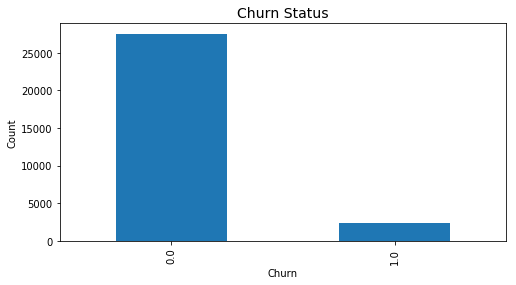

In [109]:
plt.figure(figsize=(8,4))
hvc6['churn'].value_counts().plot(kind = 'bar')
plt.ylabel('Count')
plt.xlabel('Churn')
plt.title('Churn Status',fontsize=14)

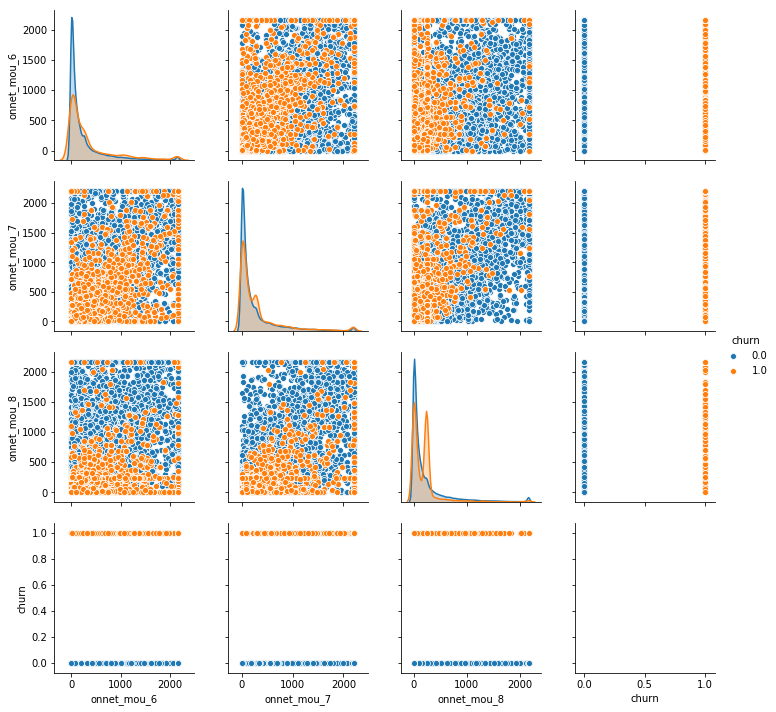

In [110]:
sns.pairplot(data=hvc6[['onnet_mou_6','onnet_mou_7','onnet_mou_8','churn']],hue='churn')

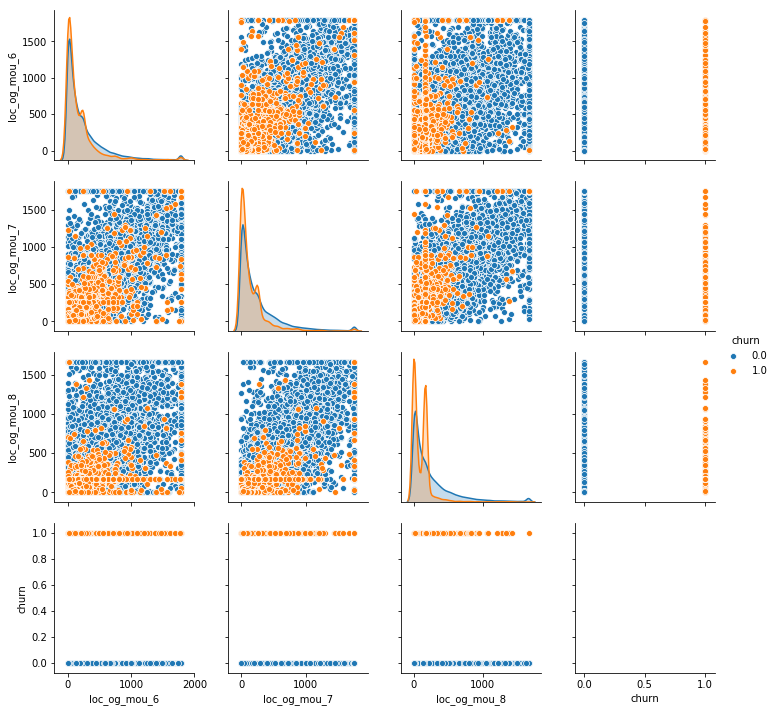

In [111]:
sns.pairplot(data=hvc6[['loc_og_mou_6','loc_og_mou_7','loc_og_mou_8','churn']],hue='churn')

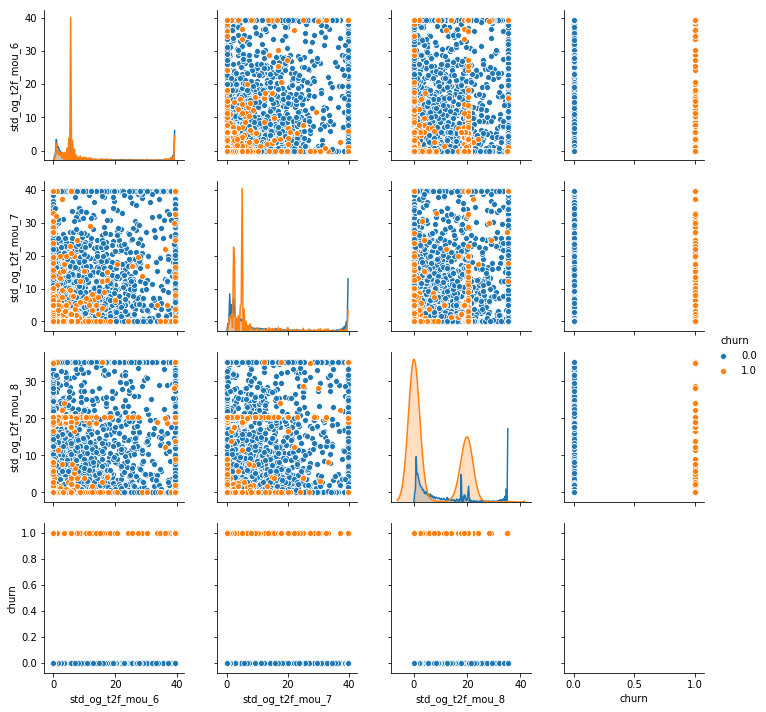

In [112]:
sns.pairplot(data=hvc6[['std_og_t2f_mou_6','std_og_t2f_mou_7','std_og_t2f_mou_8','churn']],hue='churn')

Text(0.5, 1.0, 'Non-Churn')

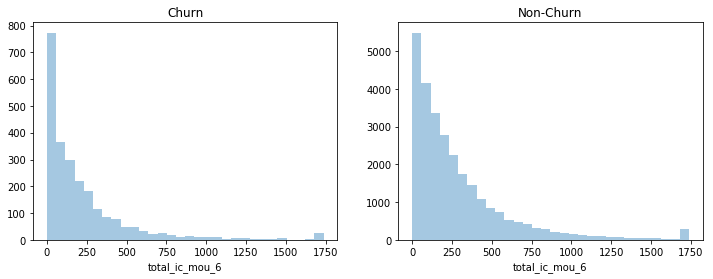

In [113]:
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(12, 4))
ax = sns.distplot(hvc6[hvc6['churn']==1].total_ic_mou_6, bins = 30, ax = axes[0], kde = False)
ax.set_title('Churn')
ax = sns.distplot(hvc6[hvc6['churn']==0].total_ic_mou_6, bins = 30, ax = axes[1], kde = False)
ax.set_title('Non-Churn')

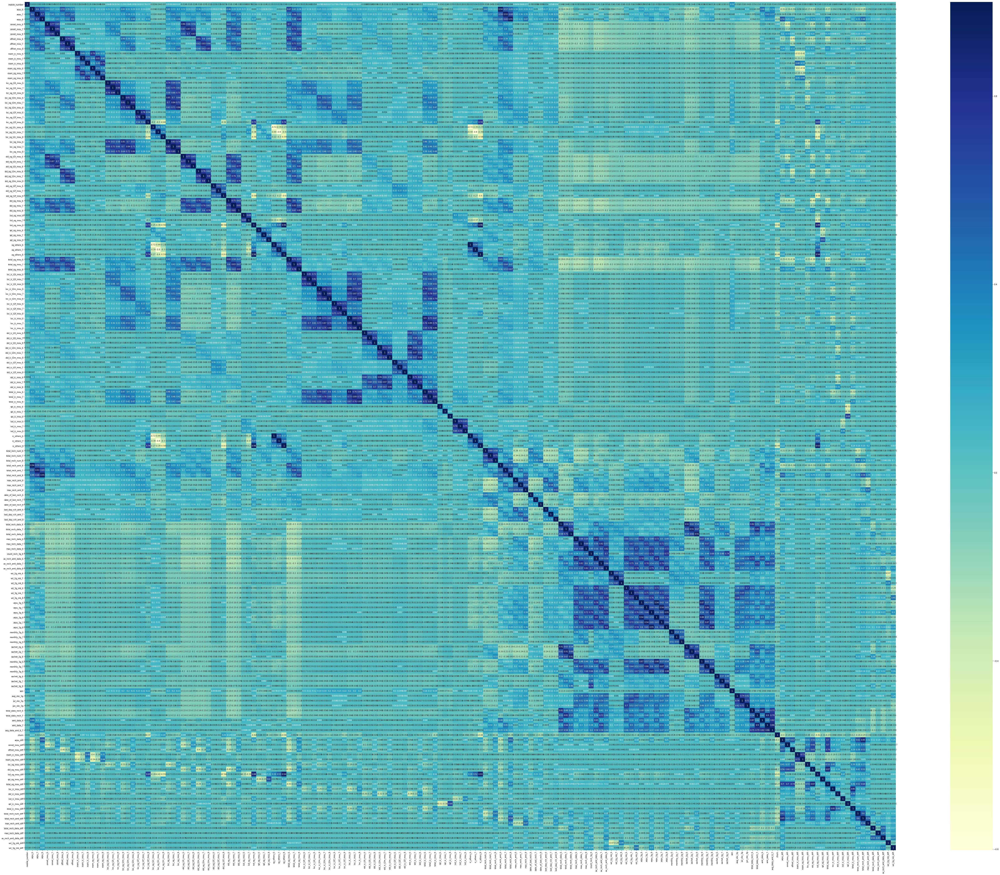

In [114]:
# Correlation using heatmap

# figure size
plt.figure(figsize=(100,80))

cor =hvc6.corr()
# heatmap
sns.heatmap(cor, cmap="YlGnBu", annot=True)
plt.show()

## Modelling

### Train - Test Split

In [0]:
# import required libraries
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA


# divide data into train and test
X = hvc6.drop("churn", axis = 1)
y = hvc6.churn
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 4, stratify = y)

In [116]:
# print shapes of train and test sets
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(22464, 172)
(22464,)
(7489, 172)
(7489,)


### Using PCA

In [0]:
# apply pca to train data
pca = Pipeline([('scaler', StandardScaler()), ('pca', PCA())])

In [0]:
pca.fit(X_train)
churn_pca = pca.fit_transform(X_train)

In [119]:
# extract pca model from pipeline
pca = pca.named_steps['pca']

# look at explainded variance of PCA components
print(pd.Series(np.round(pca.explained_variance_ratio_.cumsum(), 4)*100))

0       10.38
1       19.92
2       26.12
3       31.56
4       36.04
5       39.87
6       43.40
7       46.05
8       48.42
9       50.60
10      52.63
11      54.51
12      56.20
13      57.87
14      59.52
15      61.13
16      62.59
17      63.98
18      65.32
19      66.60
20      67.81
21      68.94
22      70.05
23      71.11
24      72.15
25      73.14
26      74.09
27      75.02
28      75.93
29      76.80
        ...  
142     99.89
143     99.90
144     99.90
145     99.91
146     99.92
147     99.93
148     99.93
149     99.94
150     99.94
151     99.95
152     99.95
153     99.96
154     99.96
155     99.97
156     99.97
157     99.97
158     99.98
159     99.98
160     99.98
161     99.98
162     99.99
163     99.99
164     99.99
165     99.99
166     99.99
167    100.00
168    100.00
169    100.00
170    100.00
171    100.00
Length: 172, dtype: float64


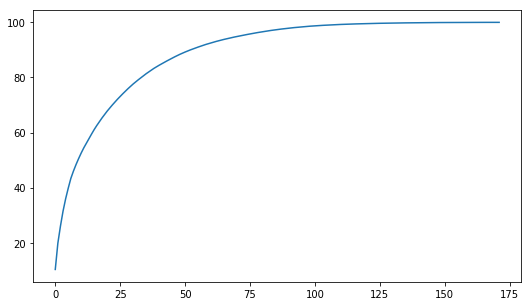

In [120]:
# plot feature variance
features = range(pca.n_components_)
cumulative_variance = np.round(np.cumsum(pca.explained_variance_ratio_)*100, decimals=4)
plt.figure(figsize=(175/20,100/20)) # 100 elements on y-axis; 175 elements on x-axis; 20 is normalising factor
plt.plot(cumulative_variance)

#### Around 60 components explain 90% variance from the above graph

   #####       
   

## Logistic Regression Model on PCA Components

In [0]:
from sklearn.pipeline import FeatureUnion
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from imblearn.metrics import sensitivity_specificity_support
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.svm import SVC


# create pipeline
PCA_VARS = 60
steps = [('scaler', StandardScaler()),
         ("pca", PCA(n_components=PCA_VARS)),
         ("logistic", LogisticRegression(class_weight='balanced'))
        ]
pipeline = Pipeline(steps)

In [122]:
# fit model
pipeline.fit(X_train, y_train)

# check score on train data
pipeline.score(X_train, y_train)

0.854789886039886

### Evaluate on test data

In [123]:
# predict churn on test data
y_pred = pipeline.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

# check area under curve
y_pred_prob = pipeline.predict_proba(X_test)[:, 1]
print("AUC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

[[5907  974]
 [ 104  504]]
Sensitivity: 	0.83
Specificity: 	0.86
AUC:    	 0.92


In [124]:
accuracy_score(y_test, y_pred)

0.856055548137268

In [125]:
recall_score(y_test, y_pred)

0.8289473684210527

### Hyperparameter Tuning - PCA and Logistic Regression

In [126]:
# class imbalance
y_train.value_counts()/y_train.shape

0.0    0.918759
1.0    0.081241
Name: churn, dtype: float64

In [0]:
# PCA
pca = PCA()

# logistic regression - the class weight is used to handle class imbalance - it adjusts the cost function
logistic = LogisticRegression(class_weight={0:0.1, 1: 0.9})

# create pipeline
steps = [("scaler", StandardScaler()), 
         ("pca", pca),
         ("logistic", logistic)
        ]

# compile pipeline
pca_logistic = Pipeline(steps)

# hyperparameter space
params = {'pca__n_components': [60, 80], 'logistic__C': [0.1, 0.5, 1, 2, 3, 4, 5, 10], 'logistic__penalty': ['l1', 'l2']}

# create 5 folds
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# create gridsearch object
model = GridSearchCV(estimator=pca_logistic, cv=folds, param_grid=params, scoring='roc_auc', n_jobs=-1, verbose=1)

In [128]:
# fit model
model.fit(X_train, y_train)

Fitting 5 folds for each of 32 candidates, totalling 160 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   38.3s
[Parallel(n_jobs=-1)]: Done 160 out of 160 | elapsed:  2.3min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('scaler',
                                        StandardScaler(copy=True,
                                                       with_mean=True,
                                                       with_std=True)),
                                       ('pca',
                                        PCA(copy=True, iterated_power='auto',
                                            n_components=None,
                                            random_state=None,
                                            svd_solver='auto', tol=0.0,
                                            whiten=False)),
                                       ('logistic',
                                        LogisticRe...
                                                           multi_class='warn',
       

In [129]:
# cross validation results
pd.DataFrame(model.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_logistic__C,param_logistic__penalty,param_pca__n_components,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,2.845041,0.136246,0.053262,0.025130,0.1,l1,60,"{'logistic__C': 0.1, 'logistic__penalty': 'l1'...",0.901762,0.903296,0.899246,0.917782,0.905630,0.905543,0.006462,30
1,3.265151,0.136253,0.070031,0.034778,0.1,l1,80,"{'logistic__C': 0.1, 'logistic__penalty': 'l1'...",0.908245,0.909381,0.905645,0.922676,0.910645,0.911318,0.005914,1
2,2.979920,0.104180,0.079128,0.031297,0.1,l2,60,"{'logistic__C': 0.1, 'logistic__penalty': 'l2'...",0.901401,0.904416,0.900315,0.918678,0.904761,0.905914,0.006606,18
3,4.020321,0.256383,0.060363,0.011266,0.1,l2,80,"{'logistic__C': 0.1, 'logistic__penalty': 'l2'...",0.906459,0.909114,0.906539,0.922283,0.909108,0.910701,0.005908,3
4,2.804859,0.419372,0.049800,0.013139,0.5,l1,60,"{'logistic__C': 0.5, 'logistic__penalty': 'l1'...",0.903970,0.903011,0.899544,0.917955,0.904921,0.905880,0.006305,19
5,3.379989,0.165298,0.060143,0.023371,0.5,l1,80,"{'logistic__C': 0.5, 'logistic__penalty': 'l1'...",0.906871,0.909433,0.906236,0.922256,0.909594,0.910878,0.005845,2
6,2.920692,0.200156,0.053523,0.026338,0.5,l2,60,"{'logistic__C': 0.5, 'logistic__penalty': 'l2'...",0.902592,0.903488,0.898979,0.919169,0.904150,0.905676,0.006979,25
7,3.976520,0.199815,0.047547,0.026163,0.5,l2,80,"{'logistic__C': 0.5, 'logistic__penalty': 'l2'...",0.906059,0.908649,0.906042,0.921976,0.908784,0.910302,0.005958,16
8,2.705116,0.215730,0.053870,0.022721,1,l1,60,"{'logistic__C': 1, 'logistic__penalty': 'l1', ...",0.902481,0.904065,0.899598,0.918013,0.904817,0.905795,0.006366,20
9,3.411082,0.133811,0.057517,0.033938,1,l1,80,"{'logistic__C': 1, 'logistic__penalty': 'l1', ...",0.906770,0.909322,0.906153,0.921952,0.909284,0.910696,0.005773,4


In [130]:
# print best hyperparameters
print("Best AUC: ", model.best_score_)
print("Best hyperparameters: ", model.best_params_)

Best AUC:  0.9113184415511046
Best hyperparameters:  {'logistic__C': 0.1, 'logistic__penalty': 'l1', 'pca__n_components': 80}


In [131]:
# predict churn on test data
y_pred = model.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

# check area under curve
y_pred_prob = model.predict_proba(X_test)[:, 1]
print("AUC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

[[6097  784]
 [ 103  505]]
Sensitivity: 	0.83
Specificity: 	0.89
AUC:    	 0.92


## Random Forest

In [0]:
# random forest - the class weight is used to handle class imbalance - it adjusts the cost function
forest = RandomForestClassifier(class_weight={0:0.1, 1: 0.9}, n_jobs = -1)

# hyperparameter space
params = {"criterion": ['gini', 'entropy'], "max_features": ['auto', 0.4]}

# create 5 folds
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# create gridsearch object
model = GridSearchCV(estimator=forest, cv=folds, param_grid=params, scoring='roc_auc', n_jobs=-1, verbose=1)

In [133]:
# fit model
model.fit(X_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:   37.0s finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True,
                                              class_weight={0: 0.1, 1: 0.9},
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=-1,
                                              oob_score=False,
                                

In [134]:
# print best hyperparameters
print("Best AUC: ", model.best_score_)
print("Best hyperparameters: ", model.best_params_)

Best AUC:  0.8955168695606929
Best hyperparameters:  {'criterion': 'entropy', 'max_features': 0.4}


In [135]:
# predict churn on test data
y_pred = model.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

# check area under curve
y_pred_prob = model.predict_proba(X_test)[:, 1]
print("AUC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

[[6793   88]
 [ 344  264]]
Sensitivity: 	0.43
Specificity: 	0.99
AUC:    	 0.91


#### As per the above, we got very poor sensitivity

### Hence the best model is PCA along with Logistic Regression

###  

### Choosing Best Features

In [136]:
# run a random forest model on train data
max_features = int(round(np.sqrt(X_train.shape[1])))    # number of variables to consider to split each node
print(max_features)

rf_model = RandomForestClassifier(n_estimators=100, max_features=max_features, class_weight={0:0.1, 1: 0.9}, oob_score=True, random_state=4, verbose=1)

13


In [137]:
# fit model
rf_model.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   19.5s finished


RandomForestClassifier(bootstrap=True, class_weight={0: 0.1, 1: 0.9},
                       criterion='gini', max_depth=None, max_features=13,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=None, oob_score=True,
                       random_state=4, verbose=1, warm_start=False)

In [138]:
# OOB score
rf_model.oob_score_

0.9431089743589743

In [139]:
# predict churn on test data
y_pred = rf_model.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

# check area under curve
y_pred_prob = rf_model.predict_proba(X_test)[:, 1]
print("ROC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[[6802   79]
 [ 343  265]]
Sensitivity: 	0.44
Specificity: 	0.99
ROC:    	 0.94


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


### Importance of Features

In [140]:
# predictors
features = hvc6.drop('churn', axis=1).columns

# feature_importance
importance = rf_model.feature_importances_

# create dataframe
feature_importance = pd.DataFrame({'variables': features, 'importance_percentage': importance*100})
feature_importance = feature_importance[['variables', 'importance_percentage']]

# sort features
feature_importance = feature_importance.sort_values('importance_percentage', ascending=False).reset_index(drop=True)
print("Sum of importance=", feature_importance.importance_percentage.sum())
feature_importance.head(50)

Sum of importance= 99.99999999999999


,variables,importance_percentage
0,roam_og_mou_8,4.428174
1,last_day_rch_amt_8,4.412012
2,total_ic_mou_8,4.329984
3,roam_ic_mou_8,3.620279
4,total_rech_amt_8,3.534863
5,arpu_diff,3.463815
6,total_rech_amt_diff,3.155582
7,total_og_mou_8,2.230098
8,date_of_last_rech_8,2.185177
9,arpu_8,2.138480


### Extracting top 30 features

In [0]:
# extract top 'n' features
top_n = 30
top_features = feature_importance.variables[0:top_n]

In [142]:
top_features

0           roam_og_mou_8
1      last_day_rch_amt_8
2          total_ic_mou_8
3           roam_ic_mou_8
4        total_rech_amt_8
5               arpu_diff
6     total_rech_amt_diff
7          total_og_mou_8
8     date_of_last_rech_8
9                  arpu_8
10       loc_ic_t2f_mou_8
11           loc_ic_mou_8
12       loc_ic_t2m_mou_8
13      total_ic_mou_diff
14     av_rech_amt_data_8
15         max_rech_amt_8
16       roam_ic_mou_diff
17        loc_ic_mou_diff
18      total_og_mou_diff
19        std_og_mou_diff
20       roam_og_mou_diff
21    total_rech_num_diff
22           loc_og_mou_8
23       loc_og_t2f_mou_8
24           isd_og_mou_8
25           isd_ic_mou_8
26            og_others_8
27        offnet_mou_diff
28       loc_og_t2m_mou_8
29        isd_og_mou_diff
Name: variables, dtype: object

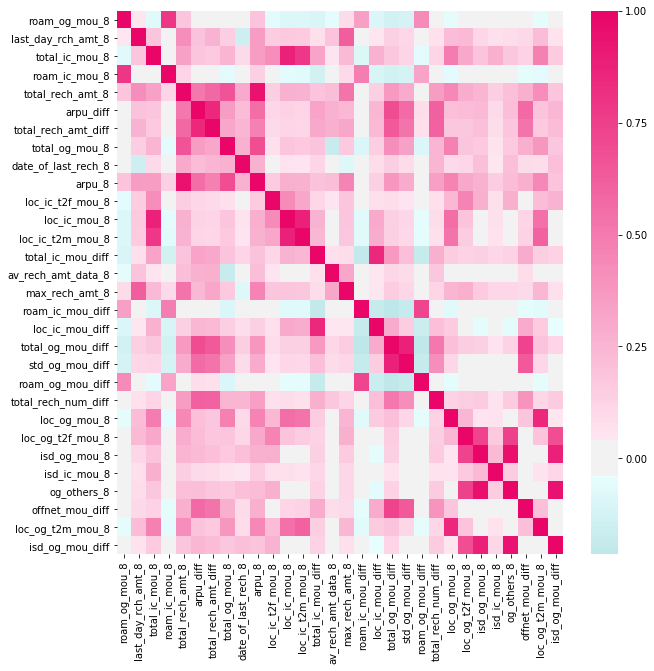

In [143]:
# plot feature correlation
import seaborn as sns
plt.rcParams["figure.figsize"] =(10,10)
mycmap = sns.diverging_palette(199, 359, s=99, center="light", as_cmap=True)
sns.heatmap(data=X_train[top_features].corr(), center=0.0, cmap=mycmap)

In [0]:
top_features = ['roam_og_mou_8', 'last_day_rch_amt_8', 'total_ic_mou_8', 'roam_ic_mou_8', 'total_rech_amt_8', 'arpu_diff', 
                'total_rech_amt_diff', 'total_og_mou_8', 'date_of_last_rech_8']
X_train = X_train[top_features]
X_test = X_test[top_features]

## Logistic Regression Model for Interpretability

In [0]:


# logistic regression
steps = [('scaler', StandardScaler()), 
         ("logistic", LogisticRegression(class_weight={0:0.1, 1:0.9}))
        ]

# compile pipeline
logistic = Pipeline(steps)

# hyperparameter space
params = {'logistic__C': [0.1, 0.5, 1, 2, 3, 4, 5, 10], 'logistic__penalty': ['l1', 'l2']}

# create 5 folds
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# create gridsearch object
model = GridSearchCV(estimator=logistic, cv=folds, param_grid=params, scoring='roc_auc', n_jobs=-1, verbose=1)



In [146]:
# fit model
model.fit(X_train, y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  80 out of  80 | elapsed:    5.3s finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=4, shuffle=True),
             error_score='raise-deprecating',
             estimator=Pipeline(memory=None,
                                steps=[('scaler',
                                        StandardScaler(copy=True,
                                                       with_mean=True,
                                                       with_std=True)),
                                       ('logistic',
                                        LogisticRegression(C=1.0,
                                                           class_weight={0: 0.1,
                                                                         1: 0.9},
                                                           dual=False,
                                                           fit_intercept=True,
                                                           intercept_scaling=1,
                                                           l1_ra

In [147]:
# print best hyperparameters
print("Best AUC: ", model.best_score_)
print("Best hyperparameters: ", model.best_params_)

Best AUC:  0.8807874597462678
Best hyperparameters:  {'logistic__C': 10, 'logistic__penalty': 'l1'}


In [148]:
# predict churn on test data
y_pred = model.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

# check sensitivity and specificity
sensitivity, specificity, _ = sensitivity_specificity_support(y_test, y_pred, average='binary')
print("Sensitivity: \t", round(sensitivity, 2), "\n", "Specificity: \t", round(specificity, 2), sep='')

# check area under curve
y_pred_prob = model.predict_proba(X_test)[:, 1]
print("ROC:    \t", round(roc_auc_score(y_test, y_pred_prob),2))

[[5904  977]
 [ 113  495]]
Sensitivity: 	0.81
Specificity: 	0.86
ROC:    	 0.89


### Extracting the Coefficients and Intercepts from the logistic model

In [0]:
logistic_model = model.best_estimator_.named_steps['logistic']

In [0]:
# intercept
intercept_df = pd.DataFrame(logistic_model.intercept_.reshape((1,1)), columns = ['intercept'])

In [0]:
# coefficients
coefficients = logistic_model.coef_.reshape((9, 1)).tolist()
coefficients = [val for sublist in coefficients for val in sublist]
coefficients = [round(coefficient, 3) for coefficient in coefficients]

logistic_features = list(X_train.columns)
coefficients_df = pd.DataFrame(logistic_model.coef_, columns=logistic_features)

In [152]:
# concatenate dataframes
coefficients = pd.concat([intercept_df, coefficients_df], axis=1)
coefficients

,intercept,roam_og_mou_8,last_day_rch_amt_8,total_ic_mou_8,roam_ic_mou_8,total_rech_amt_8,arpu_diff,total_rech_amt_diff,total_og_mou_8,date_of_last_rech_8
0,-1.468889,0.380099,-0.585633,-1.328976,0.067343,0.138908,-0.474967,-0.3074,-0.003591,-0.593867


## Strategies to manage customer churn



1.  **Treating High value customers as premium customers and providing special discounts as well as offers regularly**
2.  **Taking immediate action if any customer facing issues**
3.  **Providing good offers in roaming zone**

